## XGBoost -> Seycor example

This was based off the method described: https://arxiv.org/abs/1802.03396

Basically, a feature is added to a base set of features, if certain metrics are met or exceeded, the feature is selected for future use. The base set is always the same for each feature tested. There were other wrappers used to select features as mentioned in the thesis. However, the scripts are rough and will require substantial cleaning before I can include them. The other methods used were the recursive feature elimination and the additive method. The majority of these wrappers were run on 8-core machines and left to run overnight. I had some initial success using XGB-gpu with floyd-hub to speed up processing. Unfortunately, this was short lived as the GPU instance began crashing. I worked with floyd-hub on the issue but was unable to resolve it. I also tried Google Datalab with the same result. I currently use Google Datalab for cloud computing (as shown in the digit-recognizer-kaggle repository), but have not had the time to re-attempt xgb-gpu. Given the design of xgb, if I did attempt to use a cloud service for this model, I would probably opt for the mult-core cpu instances rather than the gpu.


I've included comments in a few places throughout the notebook. 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import scikitplot as skplt

import sklearn 
from sklearn.model_selection import cross_val_score, train_test_split, RepeatedStratifiedKFold
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import IsolationForest
from sklearn.metrics import recall_score, confusion_matrix, classification_report, log_loss
from sklearn.metrics import precision_score, accuracy_score,f1_score,roc_auc_score

from skopt import BayesSearchCV

from imblearn.over_sampling import SMOTE

import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from xgboost import XGBClassifier
from xgboost import plot_importance

import re
from sklearn.decomposition import PCA

import xgbfir
import pickle

import sys
# sys.path.append('/Users/jfa10/Desktop/Repositories/Retention/code/quickpipeline')
# sys.path.append('/Users/jfa10/Desktop/Repositories/Retention/code/cleaners')
# sys.path.append('/Users/jfa10/Desktop/Repositories/Retention/code/features')

sys.path.append('/Users/jacob/Desktop/studies/misc/Thesis/churn_model/Retention/code/quickpipeline')
sys.path.append('/Users/jacob/Desktop/studies/misc/Thesis/churn_model/Retention/code/cleaners')
sys.path.append('/Users/jacob/Desktop/studies/misc/Thesis/churn_model/Retention/code/features')
sys.path.append('/Users/jacob/Desktop/studies/misc/Thesis/churn_model/Retention/code/random_code')

# sys.path.append('/Users/jfa10/Desktop/Repositories/Retention/code/quickpipeline')
# sys.path.append('/Users/jfa10/Desktop/Repositories/Retention/code/cleaners')
# sys.path.append('/Users/jfa10/Desktop/Repositories/Retention/code/features')
# sys.path.append('/Users/jfa10/Desktop/Repositories/Retention/code/random_code')


#print(sys.path)
from quickpipeline import QuickPipeline
from J_cleaner import *
from j_features2 import *
from j_features3 import *
from plots import *

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [2]:
import warnings
warnings.filterwarnings(action='ignore')

In [3]:
csv = pd.read_csv('../../../../data/processed1/eng_10_14.csv')
# csv = pd.read_csv('/Users/jfa10/Desktop/data/Thesis/processed/eng_10_14.csv')
# REMOVE TEST SET
test_set = csv[(csv['year_'] == 2018) & (csv['quarter_'] == 2)]
data = csv[-((csv['year_'] == 2018) & (csv['quarter_'] == 2))]
data['year_feat'] = data['year_'].map({2016: 'year_2016', 2017: 'year_2017', 2018: 'year_2018'})
data['quarter_feat'] = data['quarter_'].map({1: 'q1', 2: 'q2', 3: 'q3', 4: 'q4'})
data['lag_diff_abs'] = data['lag_diff'].apply(lambda x: abs(x))

In [4]:
# FEATURES BEING TESTED
test = ['line_', 'tenure_', 
       'risk_state', 'coast_ind', 'risk_complex_ind', 'M_ind', 
       'con_type', 
       'rate_chng', 'UI_code', 'price_complex_ind', 'prgm_',
       'diff_mst_agnt', 'diff_state', 'csf_ind', 'csf_market_sh', 'csf_div',
       'tech_score', 'ed_score', 'PC_num', 'PC_cat', 'sal_serv_ind',
        'month_nom', 'month_prog', 'term', 'abs_Q',
       'prev_non', 'prev_NB', 'lag_1', 'lag_2',
        'lag_diff', 'lag_diff_abs', 
        'lag_1_auto', 'lag_1_cmp', 'lag_1_wc',
       'lag_2_auto', 'lag_2_cmp', 'lag_2_wc', 'UW_freq', 'UW_title', 'SE_freq',
       'SE_title', 'agnt_freq', 'agnt_rev', 'mstr_freq', 'mstr_rev',
       'zip_freq', 'county_freq', 'prem_freq', 
       'lag_diff_auto', 'lag_diff_cmp', 'lag_diff_wc',
       'lag_diff_ind', 'lag_diff_auto_ind', 'lag_diff_cmp_ind',
       'lag_diff_wc_ind', 'prem_bin_adj', 'prem_bin_6', 'agnt_bin_6',
       'uw_bin_6', 'zip_bin_6', 'county_bin_6', 'mstr_bin_6', 'se_bin_6',
       'agnt_bin_3', 'uw_bin_3', 'zip_bin_3', 'county_bin_3', 'mstr_bin_3',
       'se_bin_3', 'prem_bin_3', 'year_feat', 'quarter_feat']

In [ ]:
# test = ['line_', 'tenure_', 'coast_ind', 
#        'risk_state', 'ed_score']

In [ ]:
# data.columns

5.34 s ± 184 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.88 s ± 180 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


11.9 s ± 122 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.66 s ± 89.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.73 s ± 68.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.65 s ± 100 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.61 s ± 143 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.74 s ± 94.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.76 s ± 121 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.74 s ± 132 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


1min 59s ± 1.55 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.69 s ± 134 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.66 s ± 103 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.63 s ± 49.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.6 s ± 49.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.66 s ± 162 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.7 s ± 59.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.71 s ± 111 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


6.04 s ± 3.07 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


21.6 s ± 502 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 5.04 times longer than the fastest. This could mean that an intermediate result is being cached.
15.4 s ± 7 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.44 times longer than the fastest. This could mean that an intermediate result is being cached.
18.4 s ± 7.44 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.45 times longer than the fastest. This could mean that an intermediate result is being cached.
15.4 s ± 6.74 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


20.4 s ± 6.96 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


20.4 s ± 652 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.54 times longer than the fastest. This could mean that an intermediate result is being cached.
11.9 s ± 6.35 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.58 times longer than the fastest. This could mean that an intermediate result is being cached.
11.6 s ± 6.33 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.84 times longer than the fastest. This could mean that an intermediate result is being cached.
13.3 s ± 6.95 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.27 times longer than the fastest. This could mean that an intermediate result is being cached.
12.4 s ± 6.31 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.59 times longer than the fastest. This could mean that an intermediate result is being cached.
13.1 s ± 7.09 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.48 times longer than the fastest. This could mean that an intermediate result is being cached.
13.5 s ± 6.82 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


The slowest run took 4.51 times longer than the fastest. This could mean that an intermediate result is being cached.
14 s ± 6.37 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


21.6 s ± 623 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


21.3 s ± 442 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.89 s ± 169 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.97 s ± 66.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.99 s ± 156 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.87 s ± 182 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


26.5 s ± 487 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.18 s ± 231 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


21.9 s ± 406 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.94 s ± 150 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


42.1 s ± 778 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.15 s ± 165 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


10.1 s ± 464 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.91 s ± 140 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.84 s ± 123 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.69 s ± 116 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.69 s ± 40.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.83 s ± 82.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.87 s ± 88.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.17 s ± 153 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.09 s ± 123 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.05 s ± 133 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.13 s ± 247 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.48 s ± 254 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.49 s ± 171 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.51 s ± 102 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.39 s ± 59 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.36 s ± 88.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.39 s ± 143 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.36 s ± 79.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.39 s ± 110 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.06 s ± 79.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.96 s ± 150 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.94 s ± 97.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.93 s ± 83.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.98 s ± 157 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.97 s ± 122 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.95 s ± 101 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


4.94 s ± 86.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


5.12 s ± 32.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


['line_',
 'tenure_',
 'risk_state',
 'coast_ind',
 'M_ind',
 'con_type',
 'rate_chng',
 'prgm_',
 'diff_state',
 'csf_ind',
 'csf_market_sh',
 'tech_score',
 'ed_score',
 'sal_serv_ind',
 'term',
 'abs_Q',
 'prev_non',
 'prev_NB',
 'lag_1',
 'lag_2',
 'lag_diff_abs',
 'lag_1_cmp',
 'lag_1_wc',
 'lag_2_auto',
 'lag_2_wc',
 'UW_freq',
 'UW_title',
 'SE_freq',
 'SE_title',
 'agnt_freq',
 'agnt_rev',
 'county_freq',
 'prem_freq',
 'lag_diff_auto',
 'lag_diff_cmp',
 'lag_diff_wc',
 'lag_diff_ind',
 'lag_diff_auto_ind',
 'lag_diff_wc_ind',
 'prem_bin_adj',
 'agnt_bin_6',
 'uw_bin_6',
 'zip_bin_6',
 'county_bin_6',
 'uw_bin_3',
 'county_bin_3',
 'se_bin_3',
 'prem_bin_3',
 'year_feat',
 'quarter_feat']

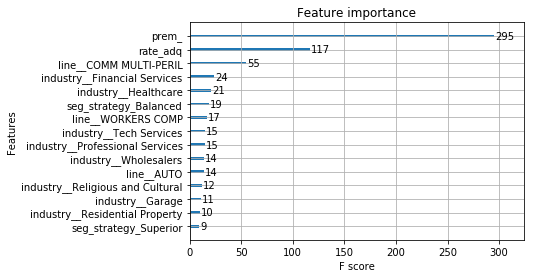

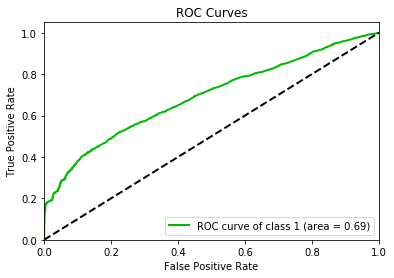

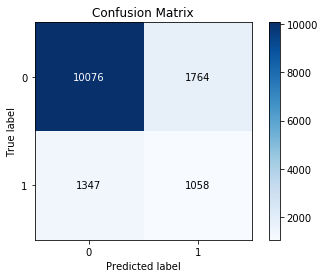

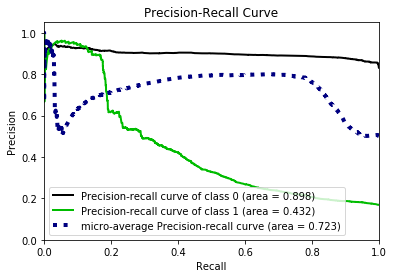

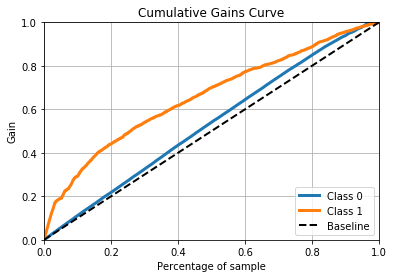

...

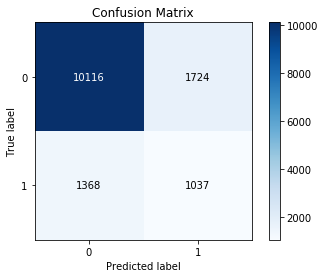

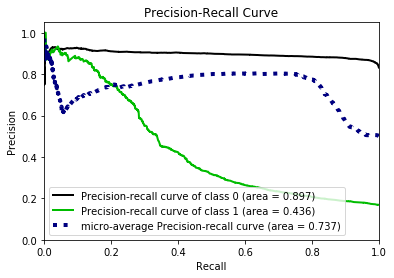

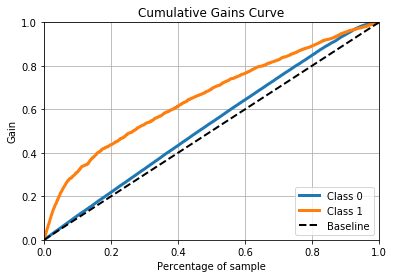

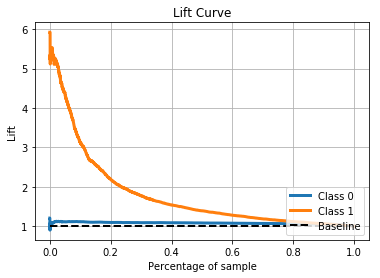

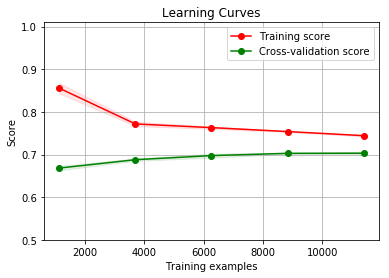

In [7]:
# THIS WOULD BE ALLOWED TO RUN OVER EXTENDED TIME PERIODS ON VARIOUS COMPUTERS
# I WAS WORKING IN THE DATALAB AT THE UNIVERSITY. THE ALERTS WOULD REMIND ME
# TO PERIODICALLY CHECK STATUS
feat_sel(test)

In [6]:
# THE AUC AND F1 WERE TAKEN FROM THE BASE SET. ANY FEATURE THAT IMPROVED THESE
# METRICS WAS SELECTED FOR FURTHER ANALYSIS

def feat_sel(set_):
    feature_set = [ ]
    for feature in set_:
        auc, f_1 = feat_info(feature)
        if ((auc > 0.7030982223127) or (f_1 > 0.3251262089177113)):
            feature_set.append(feature)
    return(feature_set)
           

In [5]:
# THIS CODE IS VERY MUCH IN PROTOTYPE STAGE. I WOULD OFTEN BREAK THE CODE 
# BACK INTO CELLS ARE REWRITE PORTIONS IN ORDER TO TRY A DIFFERENT METHOD.
# ACTUALLY, I INITIALLY BEGAN INTRODUCING FEATURES IN GROUPS - NOT THE BEST
# APPROACH I QUICKLY LEARNED.

def feat_info(feat):

    df = data[['churn', 'prem_', 'quarter_', 'year_', 
               'seg_strategy', 'industry_', 'rate_adq', feat]]           

    X_test = df[(df['year_'] == 2018) & (df['quarter_'] == 1)]
    y_test = X_test[['churn']]
    X_test.drop(['churn'], axis=1, inplace=True)
    X_test.drop(['quarter_'], axis=1, inplace=True)
    X_test.drop(['year_'], axis=1, inplace=True)

    X_train = df[-((df['year_'] == 2018) & (df['quarter_'] == 1))]
    y_train = X_train[['churn']]
    X_train.drop(['churn'], axis=1, inplace=True)
    X_train.drop(['quarter_'], axis=1, inplace=True)
    X_train.drop(['year_'], axis=1, inplace=True)


    # =============================================================================
    # OUTLIERS
    # =============================================================================

    number_df = sub_df(X_train)

    pipeline = QuickPipeline()
    X_outliers = pipeline.fit_transform(number_df)

    clf = IsolationForest(contamination=.05, random_state=290)
    clf.fit(X_outliers)
    outliers = pd.DataFrame(clf.predict(X_outliers)).rename(columns={0: 'outliers'})

    def feat_path(str):
        folder = str
        name = str + '_feat' 

        path_folder = ('seycor/' + folder + '/')

        if not os.path.exists(path_folder):
            os.makedirs(path_folder)

        path_file = (path_folder + name)

        return(path_file)

    path = feat_path(feat)


    def process(dframe):

    #             dframe['year_'] = dframe['year_'].map({2016: 'year_2016', 2017: 'year_2017', 2018: 'year_2018'})
    #             dframe['quarter_'] = dframe['quarter_'].map({1: 'q1', 2: 'q2', 3: 'q3', 4: 'q4'})

            # INDICATORS
            dichotomous = [ ]
            for col in dframe.columns:
                if dframe[col].dtype == 'int64':
                    dichotomous.append(col)
            d_v = dframe[dichotomous]
            dframe.drop(dichotomous, axis=1, inplace=True)

            return(dframe, d_v)

    X_h, d_v_h = process(X_test)
    X_tr, d_v_tr = process(X_train)

    pipeline = QuickPipeline()
    X_tr_pipe, X_h_pipe = pipeline.fit_transform(X_tr, X_h)

    # X TEST - SAMPLE

    X_test = pd.concat([X_h_pipe, d_v_h, y_test], axis=1)#.sample(n=1000, random_state=278) # was 78, 178
    y_test = X_test[['churn']]
    X_test.drop(['churn'], axis=1, inplace=True)

    # X TRAIN - SAMPLE
    # REMOVE OUTLIERS
    X_tr_merge = pd.concat([X_tr_pipe, d_v_tr, outliers, y_train], axis=1)#.sample(n=4000, random_state=279) # was 79, 179
    X_train = X_tr_merge[X_tr_merge['outliers'] != -1].drop(['outliers'], axis=1).reset_index(drop=True)
    y_train = X_train[['churn']]
    X_train.drop(['churn'], axis=1, inplace=True)

    sm = SMOTE(ratio='auto', kind='regular', k_neighbors=5, random_state=291)

    X_train_sm, y_train_sm = sm.fit_sample(X_train, y_train) 

    X_train = pd.DataFrame(X_train_sm, columns = X_train.columns)
    y_train = pd.DataFrame(y_train_sm, columns = y_train.columns)


    # =============================================================================
    # HYPERPARAMETERS Tuning 1
    # =============================================================================

    # =============================================================================
    # TRAIN MODEL WITH OPTIMIZED PARAMETERS
    # =============================================================================

    regex = re.compile(r"\[|\]|<", re.IGNORECASE)
    X_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X_train.columns.values]
    feat_names = list(X_train.columns)

    model_full = XGBClassifier(objective = 'binary:logistic', eval_metric = 'auc', 
                               n_jobs=-1, random_state=292)

    result = %timeit -o model_full.fit(X_train, y_train)

    #     pickle.dump(model_full, open(path + "_full.dat", "wb")) 
    alert()

    # =============================================================================
    # FEATURE IMPORTANCES
    # =============================================================================

    importances = model_full.feature_importances_
    indices = np.argsort(importances)[::-1][:20]
    with open(path + '_feat_list.txt', 'w') as file:
        for i in range(0, len(indices)):
            rank = ('{}. Feature: {}  with weight: {}'.format(i + 1, X_train.columns[indices[i]], importances[indices[i]]))
            file.write(rank + '\n')

    xgbfir.saveXgbFI(model_full, feature_names=feat_names, OutputXlsxFile=path + '_feat_list.xlsx')

    # plot feature importance
    plot_importance(model_full, max_num_features=15) # importance_type='gain'
    plt.savefig(path + '_feat_list.jpg')
    #     plt.show()


    # =============================================================================
    # REDUCED MODEL
    # =============================================================================

    #     model_full = pickle.load(open('../feat_models/' + name + "_full.dat", "rb"))

#     model_re = SelectFromModel(model_full, threshold='.4*mean', prefit=True)

#     X_re = model_re.transform(X_train)

#     df = pd.DataFrame(X_re)
#     shape = str(df.shape)
    shape = str(X_train.shape)
    with open(path + '_shape.txt', 'w') as file:
        file.write(shape)

#     feat = df.shape[1]
    #     feat = 25
#     importances = model_full.feature_importances_
#     indices = np.argsort(importances)[::-1][:feat]
#     feat_top = X_train.columns[indices][0:feat]

#     X_train_rd = X_train[feat_top]

    regex = re.compile(r"\[|\]|<", re.IGNORECASE)
    X_test.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X_test.columns.values]
    feat_names = list(X_test.columns)

#     X_test_rd = X_test[feat_top]


    # =============================================================================
    # HYPERPARAMETERS -> 2nd tuning
    # =============================================================================

    # =============================================================================
    # TRAIN REDUCED MODEL WITH OPTIMIZED PARAMETERS
    # =============================================================================

#     regex = re.compile(r"\[|\]|<", re.IGNORECASE)
#     X_train_rd.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X_train_rd.columns.values]
#     feat_names = list(X_train_rd.columns)

#     model_rd = XGBClassifier(objective = 'binary:logistic', nthread = -1, 
#                              eval_metric = 'auc', n_jobs=-1)

#     result = %timeit -o model_rd.fit(X_train_rd, y_train)

#     pickle.dump(model_rd, open(path + "_rd_xgb.dat", "wb")) 

    #     model_rd = pickle.load(open('../feat_models/lag_base1.dat', "rb"))

    # =============================================================================
    # ROC CURVES AND TEST
    # =============================================================================

    y_pred = model_full.predict(X_test)
    y_logloss = model_full.predict_proba(X_test)

    auc = roc_auc_score(y_test, y_logloss[:, 1])
    logloss = log_loss(y_test, y_logloss)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    report = confusion_matrix(y_test, y_pred)

    scores = 'auc: ' + str(auc) + ' logloss: ' + str(logloss) + '\n' + ' recall: ' + str(recall) +\
    ' precision: ' + str(precision) + ' accuracy: ' + str(acc) + ' f1: '+ str(f1) + '\n' +\
    str(report[0]) + '\n' + str(report[1]) + '\n' + ' time: ' + str(result) 
    
    with open(path + '_scores' + '.txt', 'w') as file:
        file.write(scores)

    skplt.metrics.plot_roc(y_test, y_logloss, classes_to_plot=1, plot_micro=False, plot_macro=False)                     
    plt.savefig(path + '_roc_xgb.jpg')
    skplt.metrics.plot_confusion_matrix(y_test, y_pred)
    plt.savefig(path + '_cm_xgb.jpg')
    skplt.metrics.plot_precision_recall(y_test, y_logloss)
    plt.savefig(path + '_pr_xgb.jpg')
    skplt.metrics.plot_cumulative_gain(y_test, y_logloss)
    plt.savefig(path + '_cg_xgb.jpg')
    skplt.metrics.plot_lift_curve(y_test, y_logloss)
    plt.savefig(path + '_lc_xgb.jpg')
    # plt.show

    alert()

    # =============================================================================
    # TEST REDUCED MODEL WITH CV
    # =============================================================================

    rskf_4 = RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=293)


    auc = cross_val_score(model_full, X_test, y_test, cv=rskf_4, scoring='roc_auc', verbose=0, n_jobs=-1).mean()
    f_1 = cross_val_score(model_full, X_test, y_test, cv=rskf_4, scoring='f1', verbose=0, n_jobs=-1).mean()


    with open(path + '_cv_scores.txt', 'w') as file:
        for metric in ["accuracy", "precision", "recall", 'roc_auc', 'neg_log_loss', 'f1']:
            score = cross_val_score(model_full, X_test, y_test, cv=rskf_4, scoring=metric, n_jobs=-1, verbose=0).mean()
            metric_score = str(metric) + ': ' + str(score) 
            file.write(metric_score + '\n')

    # =============================================================================
    # LEARNING/ROC CURVES AND FULL TEST
    # =============================================================================

    title = "Learning Curves"
    plot_learning_curve(model_full, title, X_test, y_test, ylim=(0.5, 1.01), cv=rskf_4, n_jobs=-1)
    plt.savefig(path + '_learning_curve.jpg')
#     plt.show()
#     pickle.dump(model_full, open(path + "_full.dat", "wb"))
    alert()
    alert()

    return(auc, f_1)

